# FPP optimization workflow 

In [42]:
using Revise
using FUSE
using IMAS
using Plots;
FUSE.logging(Logging.Info; actors=Logging.Debug);

## Make new FPP equilibirum from scratch

### Initialize from FPP v1 demount

In [43]:
dd = IMAS.dd()
ini, act = FUSE.case_parameters(:FPP, version=:v2);

In [44]:
ini

FUSE.ParametersInits{Float64}
├─ general
│  ├─ casename{String} ➡ "FPP_v2" Sort mnemonic name of the case being run
│  ├─ description{String} ➡ missing Longer description of the case being run
│  ├─ init_from{Symbol} ➡ :scalars Initialize run from [:ods, :scalars]
│  └─ dd{dd} ➡ missing dd to initialize from
├─ time
│  ├─ pulse_shedule_time_basis{AbstractRange{Float64}} ➡ 0.0:0.2:200.0 [s] Time basis used to discretize the pulse schedule
│  └─ simulation_start{Float64} ➡ 100.0 [s] Time at which the simulation starts
├─ gasc
│  ├─ filename{String} ➡ missing Output GASC .json file from which data will be loaded
│  └─ case{Int64} ➡ missing Number of the GASC run to load
├─ ods
│  └─ filename{String} ➡ missing ODS.json file(s) from which equilibrium is loaded. Multiple comma-separated ODSs can be
│     specified.
├─ build
│  ├─ layers
│  │  ├─ 1
│  │  │  ├─ name{String} ➡ "gap OH" Name of the layer
│  │  │  ├─ thickness{Float64} ➡ 1.180137712438599 Relative thickness of the layer (layers a

### Modify ini

In [45]:
ini.equilibrium.R0 = 5.0
ini.equilibrium.B0 = 6.0
ini.equilibrium.ip = 8.5e6
ini.equilibrium.ϵ = missing # 1/3.5
ini.equilibrium.κ = missing # 2.1
ini.equilibrium.δ = missing # 0.6
ini.equilibrium.ζ = 0.0
ini.equilibrium.pressure_core = 1.5e6
ini.equilibrium.field_null_surface = 0.8
ini.equilibrium.xpoints = :lower

ini.core_profiles.impurity = :Kr
ini.core_profiles.n_shaping = 2.5
ini.core_profiles.T_shaping = 2.5
ini.core_profiles.T_ratio = 0.825
ini.core_profiles.greenwald_fraction = 1.1
ini.core_profiles.ne_ped = missing
ini.core_profiles.greenwald_fraction_ped = 0.75
ini.core_profiles.helium_fraction = 0.04
ini.core_profiles.zeff = 1.75

ini.ec_launcher[1].power_launched = 25.0e6 #W

mhx_order = 5
R0 = ini.equilibrium.R0
eps = 1/3.5
a = R0*eps
kapu = 2.0
kapl = 2.2
delu = 0.5
dell = 0.7
zetaou = -0.0
zetaol = -0.4
zetaiu = -0.0
zetail = -0.2
upnull = false
lonull = true

r, z, zref = try
    IMAS.boundary_shape(; a, eps, kapu, kapl, delu, dell, zetaou, zetaiu, zetaol, zetail, zoffset=0.0, upnull, lonull)
catch e
    [NaN], [NaN], [NaN]
end

mxh = IMAS.MXH(r, z, mhx_order)
mxh_vect = IMAS.flat_coeffs(mxh)

ini.equilibrium.boundary_from = :MXH_params
ini.equilibrium.MXH_params = mxh_vect

#plot(r, z; aspect_ratio=:equal, lw=2, label="numerical")
#display(plot!(mxh,label="MXH"))
#display(mxh)

ini.build.plasma_gap = 0.125
ini.build.divertors = :lower
ini.build.symmetric = false
ini.build.n_first_wall_conformal_layers = 2

ini.pf_active.n_coils_outside = 6
ini.pf_active.n_coils_inside = 0
ini.pf_active.technology = :Nb3Sn
ini.tf.shape = :princeton_D #_scaled
ini.oh.n_coils = 6

ini.requirements.flattop_duration = 24*3600.0

86400.0

In [46]:
R0 = ini.equilibrium.R0
ϵ = eps
a = R0*ϵ

RiPlasma = R0 - a

layers = FUSE.OrderedCollections.OrderedDict{String,Float64}()

# HFS layers

layers["plasma"] = 2*a*(1+ini.build.plasma_gap)
layers["hfs first wall"] = 0.02
layers["hfs blanket"] = 0.55*((1/ϵ-1.8)/2.2)^0.5
layers["hfs high temp shield"] = RiPlasma*0.05
layers["hfs gap high temp shield vacuum vessel"] = RiPlasma * 0.02
layers["hfs vacuum vessel"] = RiPlasma * 0.05
layers["hfs gap vacuum vessel low temp shield"] = RiPlasma * 0.02
layers["hfs low temp shield"] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
layers["hfs gap low temp shield TF"] = RiPlasma * 0.02

rbCenterPost = (R0 - 0.5*layers["plasma"] - layers["hfs first wall"] - layers["hfs blanket"]
    - layers["hfs high temp shield"] - layers["hfs gap high temp shield vacuum vessel"]
    - layers["hfs vacuum vessel"] - layers["hfs gap vacuum vessel low temp shield"]
    - layers["hfs low temp shield"] - layers["hfs gap low temp shield TF"]);

layers["hfs TF"] = rbCenterPost * 0.25
layers["OH"] = rbCenterPost * 0.25
layers["gap TF OH"] = RiPlasma * 0.02
layers["gap OH"] = rbCenterPost - layers["hfs TF"] - layers["gap TF OH"] - layers["OH"]

# LFS layers

layers["lfs first wall"] = 0.02
layers["lfs blanket"] = 1.0 - 0.25*((1/ϵ-2.1)/1.9)^0.5
layers["lfs high temp shield"] = RiPlasma * 0.05
layers["lfs gap high temp shield vacuum vessel"] = RiPlasma * 0.4
layers["lfs vacuum vessel"] = RiPlasma * 0.05
layers["lfs gap vacuum vessel low temp shield"] = RiPlasma * 0.02
layers["lfs low temp shield"] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
layers["lfs gap low temp shield TF"] = RiPlasma * 0.02
layers["lfs TF"] = layers["hfs TF"]
layers["gap cryostat"] = RiPlasma * 0.6
layers["cryostat"] = 0.2

for layer in ini.build.layers
    layer.thickness = layers[layer.name]
    if occursin("vacuum vessel", layer.name) || occursin("shield", layer.name) || occursin("blanket", layer.name)
        layer.shape = :rectangle_ellipse
    end
end


### Modify act

In [47]:
act

FUSE.ParametersActors{Float64}
├─ ActorARIESCosting
│  ├─ land_space{Float64} ➡ 1000.0 [acres] Plant site space required
│  ├─ building_volume{Float64} ➡ 140000.0 [m^3] Volume of the tokmak building
│  ├─ interest_rate{Float64} ➡ 0.05 Annual interest rate fraction of direct capital cost
│  ├─ indirect_cost_rate{Float64} ➡ 0.4 Indirect cost associated with construction, equipment, services, engineering
│  │  construction management and owners cost
│  ├─ escalation_fraction{Float64} ➡ 0.05 Yearly escalation fraction based on risk assessment
│  └─ blanket_lifetime{Float64} ➡ 6.8 [year] Lifetime of the blanket
├─ ActorBalanceOfPlant
│  ├─ generator_conversion_efficiency{Float64} ➡ 0.95 Efficiency of the generator
│  └─ do_plot{Bool} ➡ false Plot
├─ ActorBlanket
│  ├─ minimum_first_wall_thickness{Float64} ➡ 0.02 [m] Minimum first wall thickness
│  ├─ blanket_multiplier{Float64} ➡ 1.2 Neutron thermal power multiplier in blanket
│  ├─ thermal_power_extraction_efficiency{Float64} ➡ 1.0 Fractio

In [48]:
act.ActorEquilibrium.model = :TEQUILA
act.ActorEquilibrium.symmetrize = false

act.ActorECsimple.rho_0 = [0.5]
act.ActorECsimple.width = [0.05]

act.ActorPedestal.update_core_profiles = false
act.ActorPedestal.only_powerlaw = false
act.ActorPedestal.T_ratio_pedestal = 1.0

act.ActorHFSsizing.do_plot = true
act.ActorHFSsizing.verbose = true
act.ActorHFSsizing.j_tolerance = 0.5
act.ActorHFSsizing.stress_tolerance = 0.01
act.ActorHFSsizing.error_on_technology = false
act.ActorHFSsizing.error_on_performance = false
act.ActorFluxSwing.operate_oh_at_j_crit = true

act.ActorLFSsizing.maintenance = :vertical
act.ActorLFSsizing.tor_modularity = 2
act.ActorLFSsizing.pol_modularity = 1

act.ActorPFactive.do_plot = true
act.ActorPFactive.update_equilibrium = false
act.ActorCXbuild.rebuild_wall = false

act.ActorPFdesign.do_plot = true
act.ActorPFdesign.symmetric = false

act.ActorPowerNeeds.model = :thermal_power_fraction
act.ActorPowerNeeds.thermal_power_fraction = 0.2

act.ActorThermalCycle.power_cycle_type = :fixed_cycle_efficiency
act.ActorThermalCycle.fixed_cycle_efficiency = 0.4

act.ActorStabilityLimits.raise_on_breach = false

act.ActorCosting.model = :GASC
act.ActorCosting.production_increase = 10.0
act.ActorCosting.learning_rate = 0.616

act.ActorFixedProfiles.T_shaping = ini.core_profiles.T_shaping
act.ActorFixedProfiles.n_shaping = ini.core_profiles.n_shaping
act.ActorFixedProfiles.T_ratio_pedestal = 1.0
act.ActorFixedProfiles.T_ratio_core = ini.core_profiles.T_ratio
act.ActorFixedProfiles.update_pedestal = true

act.ActorCoreTransport.model = :FixedProfiles

act.ActorStationaryPlasma.convergence_error = 5e-3
act.ActorStationaryPlasma.max_iter = 8
act.ActorStationaryPlasma.do_plot = true

true

## Run WholeFacility Actor

[ Info: Equilibrium
[ Info:  TEQUILA


[ Info: HCD
[ Info:  ECsimple
[ Info:  ICsimple
[ Info:  LHsimple
[ Info:  NBsimple


[ Info: SteadyStateCurrent


[ Info: CXbuild


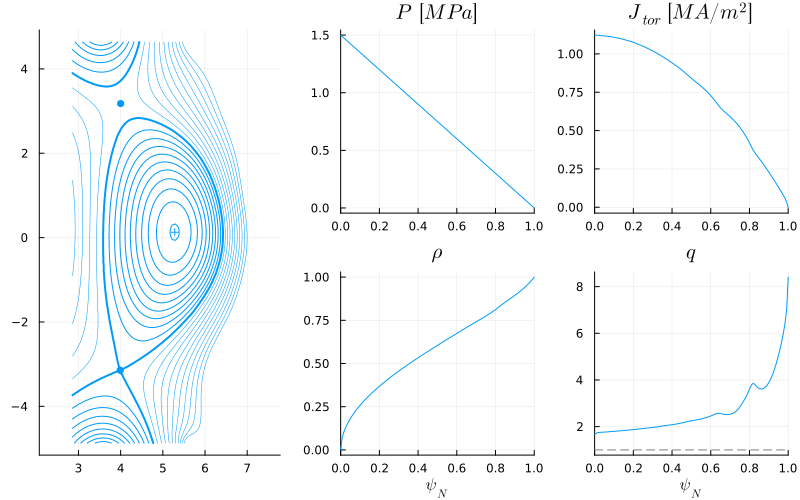

0.024915698492325333

In [49]:
dd = IMAS.dd()
FUSE.init(dd, ini, act; do_plot=false);
mxh_plot = plot(dd.equilibrium, show_x_points=true)
display(mxh_plot)
eq = dd.equilibrium.time_slice[]
dRsep = maximum(eq.boundary_secondary_separatrix.outline.r) - maximum(eq.boundary.outline.r)

In [50]:
# modify secondary X point

XP2_R = 4.0
XP2_Z = 4.0

dd.pulse_schedule.position_control.x_point[1].r.reference.data .= XP2_R
dd.pulse_schedule.position_control.x_point[1].z.reference.data .= XP2_Z

display(dd.pulse_schedule.position_control.x_point)

# modify outer strike point

if false
    OSP_R = 4.5
    OSP_Z = -3.75

    pc = dd.pulse_schedule.position_control
    time0 = 100.0

    resize!(pc.strike_point, 1; wipe=false)

    IMAS.set_time_array(pc.strike_point[1].r.reference, :data, time0, OSP_R)
    IMAS.set_time_array(pc.strike_point[1].z.reference, :data, time0, OSP_Z)

    display(dd.pulse_schedule.position_control.strike_point)
end

x_point
├─ 1
│  ├─ r
│  │  └─ reference
│  │     ├─ data ➡ [4,4,4] [mixed]
│  │     └─ time ➡ [-Inf,100,Inf] [s]
│  └─ z
│     └─ reference
│        ├─ data ➡ [4,4,4] [mixed]
│        └─ time ➡ [-Inf,100,Inf] [s]
└─ 2
   ├─ r
   │  └─ reference
   │     ├─ data ➡ [3.98931,3.98931,3.98931] [mixed]
   │     └─ time ➡ [-Inf,100,Inf] [s]
   └─ z
      └─ reference
         ├─ data ➡ [-3.14225,-3.14225,-3.14225] [mixed]
         └─ time ➡ [-Inf,100,Inf] [s]


[ Info: WholeFacility


[ Info:  StationaryPlasma


Jtor0_before = 0.58 MA/m²
P0_before = 1699.86 kPa
βn_MHD = 4.81
βn_tot = 4.10
Te_ped = 3.06e+03 eV
rho_ped = 0.9500


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.73 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 4.32
     βn_tot = 3.98
     Te_ped = 2.28e+03 eV
    rho_ped = 0.9472


[ Info: Iteration = 1 , convergence error = 0.04564, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.65 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 3.59
     βn_tot = 3.99
     Te_ped = 1.89e+03 eV
    rho_ped = 0.9617


[ Info: Iteration = 2 , convergence error = 0.03621, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 1.04 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 3.83
     βn_tot = 3.93
     Te_ped = 1.92e+03 eV
    rho_ped = 0.9463


[ Info: Iteration = 3 , convergence error = 0.0468, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 1.00 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 4.00
     βn_tot = 3.92
     Te_ped = 1.87e+03 eV
    rho_ped = 0.9465


[ Info: Iteration = 4 , convergence error = 0.01563, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.92 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 3.90
     βn_tot = 3.93
     Te_ped = 1.85e+03 eV
    rho_ped = 0.9477


[ Info: Iteration = 5 , convergence error = 0.00517, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA


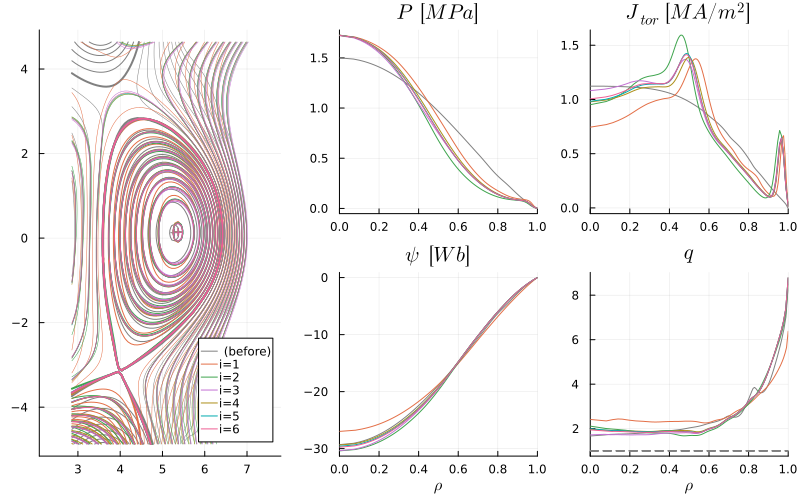

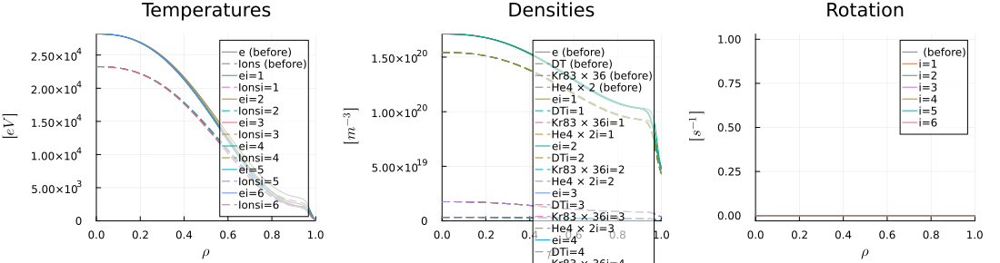

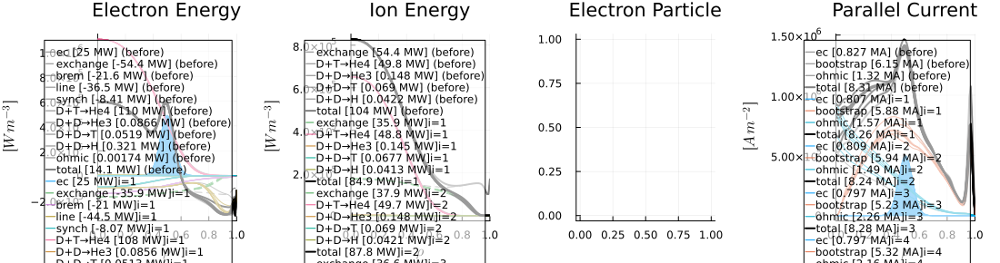


Jtor0_after = 0.95 MA m^2
   P0_after = 1699.87 kPa
     βn_MHD = 3.89
     βn_tot = 3.93
     Te_ped = 1.85e+03 eV
    rho_ped = 0.9472


[ Info: Iteration = 6 , convergence error = 0.00397, threshold = 0.005


[ Info:  StabilityLimits
[ Info:  HFSsizing


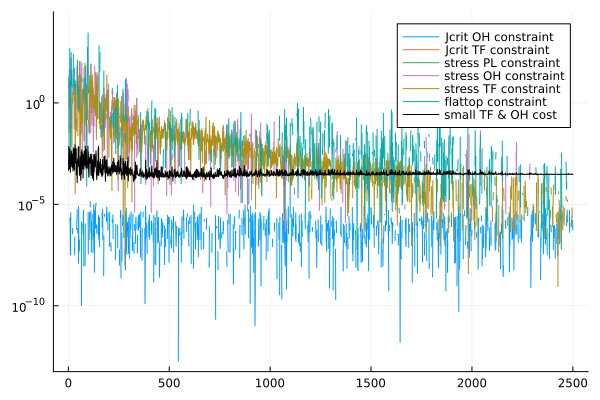

(0.0002997652384573269, [-4.232374655464581e-7, -0.009327013862825036, -0.0003674105803136354, -0.071648350727279, -3.1426141614320226e-7, 0.0], [0.0])
Optimization Result
  Iteration:       50
  Minimum:         0.000299765
  Minimizer:       [0.283146, 0.346419, 0.746216, 0.799645]
  Function calls:  2500
  Feasibles:       50 / 50 in final population
  Total time:      6.0159 s
  Stop reason:     Maximum number of iterations exceeded.
[PL.thickness] = 

[ Info:   FluxSwing
[ Info:   Stresses
[ Info:   FluxSwing
[ Info:   Stresses


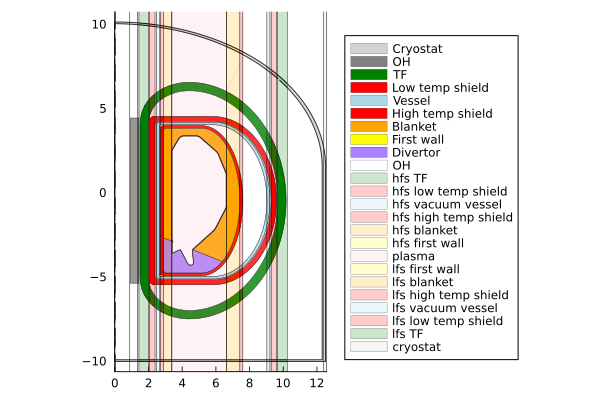

[0.8902989763399349]
[OH.thickness, dd.build.oh.technology.fraction_steel] = [0.471886611372722, 0.7462162170383078]
[TFhfs.thickness, dd.build.tf.technology.fraction_steel] = [0.5662569188799388, 0.7996451262493204]

target_B0 = 6.000104066661404
(dd.build.tf.max_b_field * TFhfs.end_radius) / R0 = 6.006791835859173

dd.build.oh.flattop_duration = 95619.59854575642
dd.requirements.flattop_duration = 86400.0
dd.build.oh.flattop_duration / dd.requirements.flattop_duration = 1.1067083165018106

dd.build.oh.max_j = 3.2934722527909786e7
dd.build.oh.critical_j = 4.943424408205886e7
dd.build.oh.critical_j / dd.build.oh.max_j = 1.500976485840041

dd.build.tf.max_j = 2.4585589242218953e7
dd.build.tf.critical_j = 5.035774808808475e7
dd.build.tf.critical_j / dd.build.tf.max_j = 2.048262809239863

maximum(cs.stress.vonmises.oh) = 7.155829968131601e8
cs.properties.yield_strength.oh = 8.0e8
cs.properties.yield_strength.oh / maximum(cs.stress.vonmises.oh) = 1.1179695486935688

maximum(cs.stress.vonmi

[ Info:  LFSsizing
[ Info:  CXbuild


[ Info:  PassiveStructures


[ Info:  PFdesign


[ Info:   PFactive


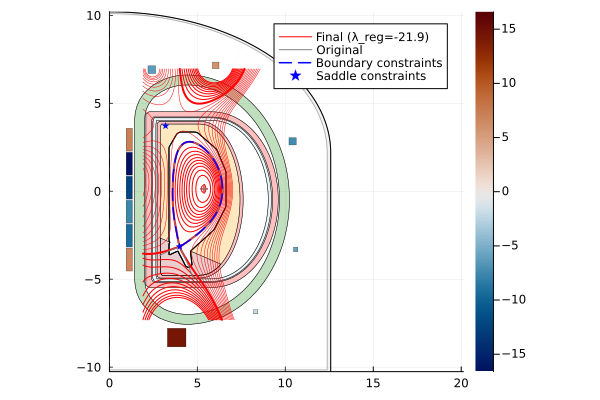

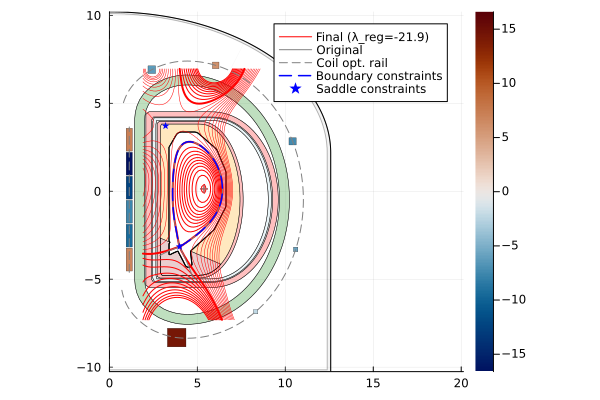

[ Info:  Neutronics


[ Info:  Blanket


[ Info:   CXbuild


[ Info:  Divertors


[ Info:  BalanceOfPlant
[ Info:   HeatTransfer
[ Info:   ThermalCycle


[ Info:   PowerNeeds
[ Info:  Costing
[ Info:   GASCCosting
[ Info:    SheffieldCosting
┌ Warning: Inflation data not available for 2010
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122


┌ Warning: Inflation data not available for 1983
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122
┌ Warning: Inflation data not available for 1983
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122
┌ Warning: Inflation data not available for 1983
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122


In [51]:
FUSE.ActorWholeFacility(dd, act);

## Summary

In [52]:
show(FUSE.timer)

 ────────────────────────────────────────────────────────────────────────────────
                                        Time                    Allocations      
                               ───────────────────────   ────────────────────────
       Tot / % measured:            1376s /   5.1%           83.2GiB /  10.0%    

 Section               ncalls     time    %tot     avg     alloc    %tot      avg
 ────────────────────────────────────────────────────────────────────────────────
 WholeFacility              2    63.0s   89.7%   31.5s   5.84GiB   70.2%  2.92GiB
   StationaryPlasma         2    33.1s   47.1%   16.5s   2.74GiB   33.0%  1.37GiB
     Equilibrium           12    30.2s   43.0%   2.51s   2.51GiB   30.1%   214MiB
       TEQUILA             12    29.1s   41.4%   2.42s   2.25GiB   27.0%   192MiB
     HCD                   14    337ms    0.5%  24.1ms   29.9MiB    0.4%  2.13MiB
       ECsimple            14   71.4ms    0.1%  5.10ms   6.44MiB    0.1%   471KiB
       LHsimple

PowerNeeds             2   15.3ms    0.0%  7.65ms    948KiB    0.0%   474KiB
   StabilityLimits          2   18.5ms    0.0%  9.24ms    911KiB    0.0%   455KiB
   LFSsizing                2   14.7ms    0.0%  7.35ms    932KiB    0.0%   466KiB
 init                       1    7.24s   10.3%   7.24s   2.49GiB   29.8%  2.49GiB
   init_pulse_schedule      1    3.93s    5.6%   3.93s   2.23GiB   26.8%  2.23GiB
   init_equilibrium         1    1.84s    2.6%   1.84s    109MiB    1.3%   109MiB
     Equilibrium            2    1.83s    2.6%   915ms    108MiB    1.3%  54.1MiB
       TEQUILA              2    1.61s    2.3%   805ms   69.1MiB    0.8%  34.6MiB
   init_build               1    225ms    0.3%   225ms   77.5MiB    0.9%  77.5MiB
     CXbuild                2    221ms    0.3%   110ms   77.2MiB    0.9%  38.6MiB
   init_pf_active           1    176ms    0.3%   176ms   2.72MiB    0.0%  2.72MiB
   init_core_sources        1   98.8ms    0.1%  98.8ms   7.37MiB    0.1%  7.37MiB
     HCD             

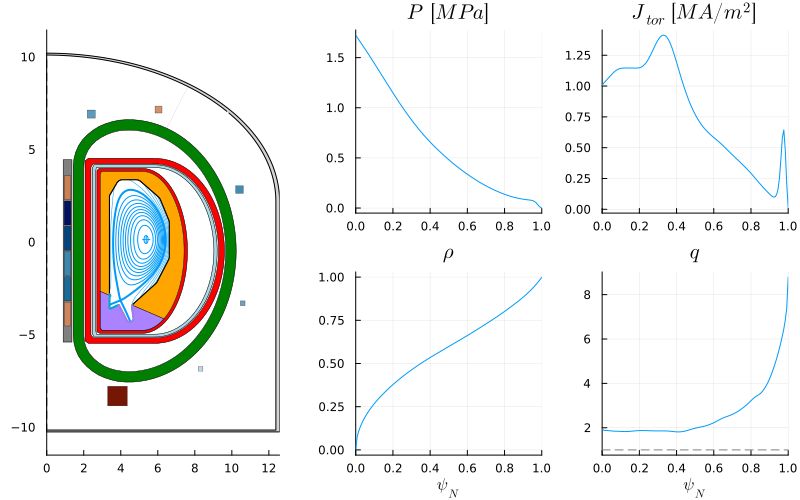

GEOMETRY                         EQUILIBRIUM                      TEMPERATURES                     DENSITIES                        
─────────────────────────────    ─────────────────────────────    ─────────────────────────────    ─────────────────────────────    
R0 → 5 [m]                       B0 → 6 [T]                       Te0 → 28.2 [keV]                 ne0 → 1.71e+20 [m⁻³]             
a → 1.43 [m]                     ip → 8.29 [MA]                   Ti0 → 23.2 [keV]                 ne_ped → 9.54e+19 [m⁻³]          
1/ϵ → 3.5                        q95 → 5.49                       <Te> → 11.3 [keV]                <ne> → 1.24e+20 [m⁻³]            
κ → 2.1                          <Bpol> → 0.706 [T]               <Ti> → 9.56 [keV]                ne0/<ne> → 1.37                  
δ → 0.506                        βpol_MHD → 2.53                  Te0/<Te> → 2.49                  fGW → 1.09                       
ζ → -0.0605                      βtor_MHD → 0.0379                Ti0

24×9 DataFrame
 Row │ group   details     type      ΔR         R_start    R_end      material      area        volume    
     │ String  String      String    Float64    Float64    Float64    String        Float64     Float64   
─────┼────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                            0.890299    0.0        0.890299                  8.7651      24.5156
   2 │ in                  oh        0.471887    0.890299   1.36219   ReBCO           4.64578     32.8754
   3 │ in                            0.0714309   1.36219    1.43362                   0.703246     6.1768
   4 │ hfs                 tf        0.566257    1.43362    1.99987   ReBCO          20.5813     258.616
   5 │ hfs                           0.0714309   1.99987    2.0713                   16.1855     535.967
   6 │ hfs     low temp    shield    0.318153    2.0713     2.38946   Steel           9.33137    310.793
   7 │ hfs                     

​


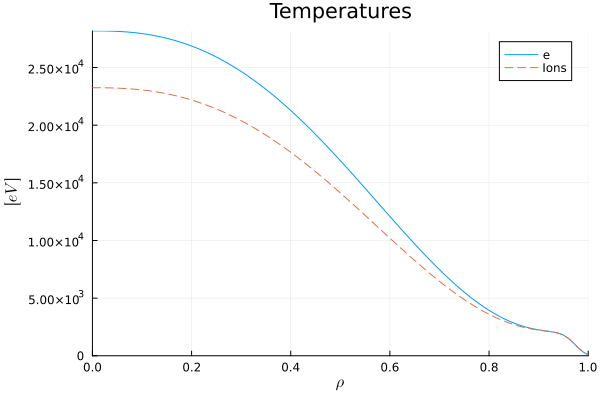

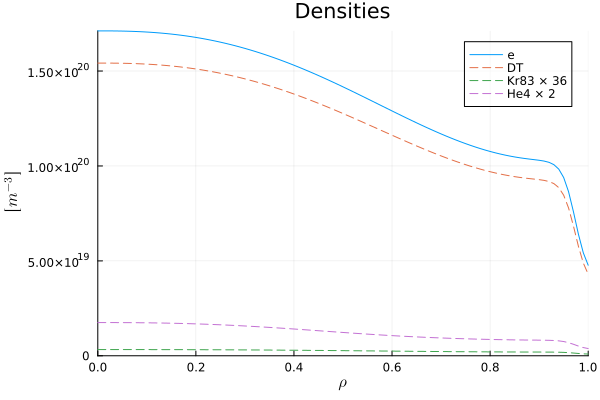

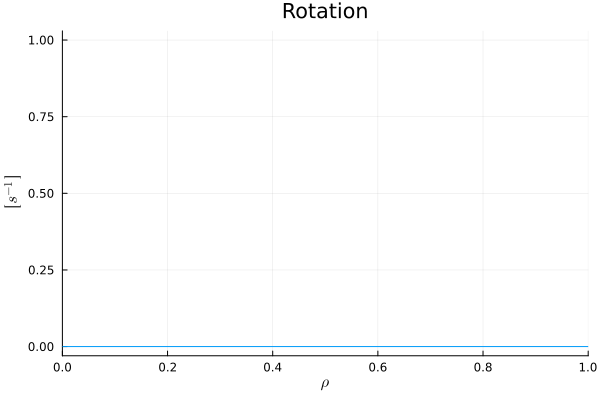

​
​
​


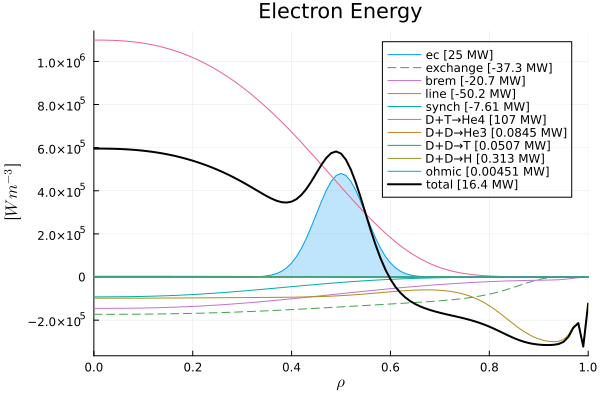

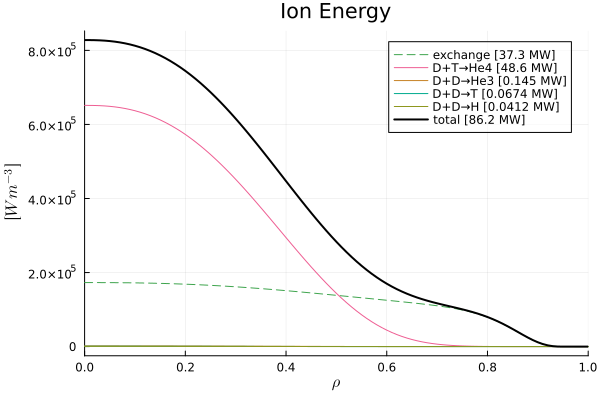

​
​


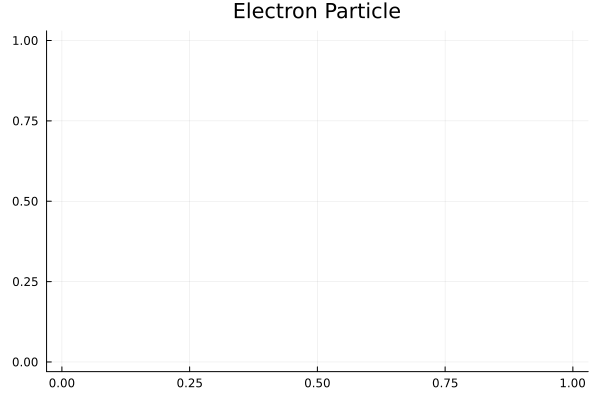

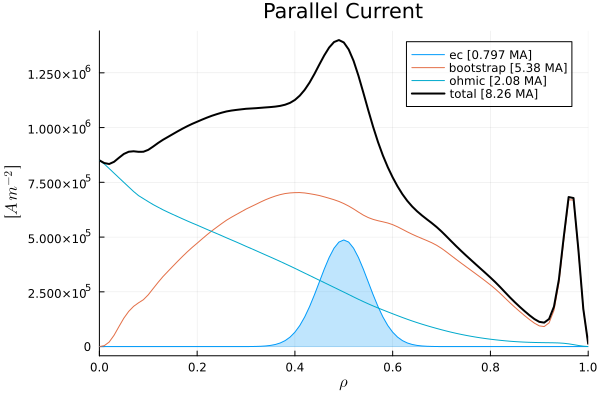

​
​


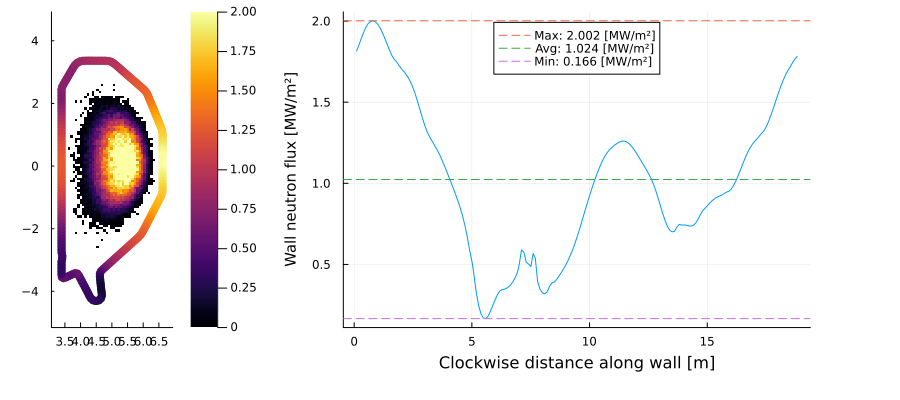

​


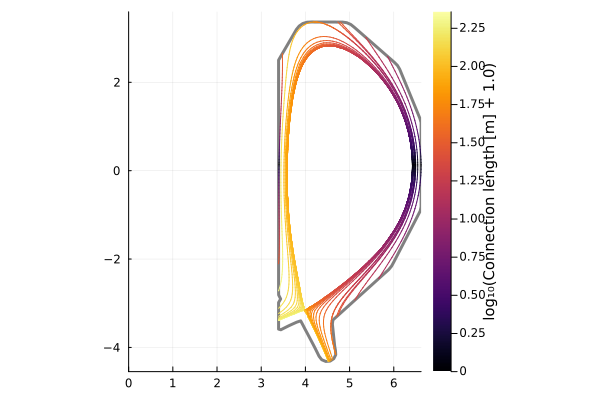

​


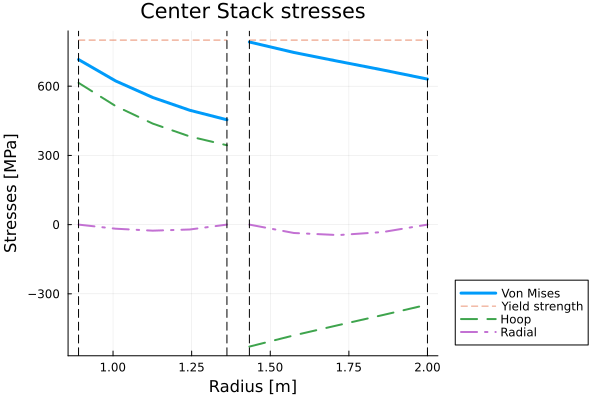

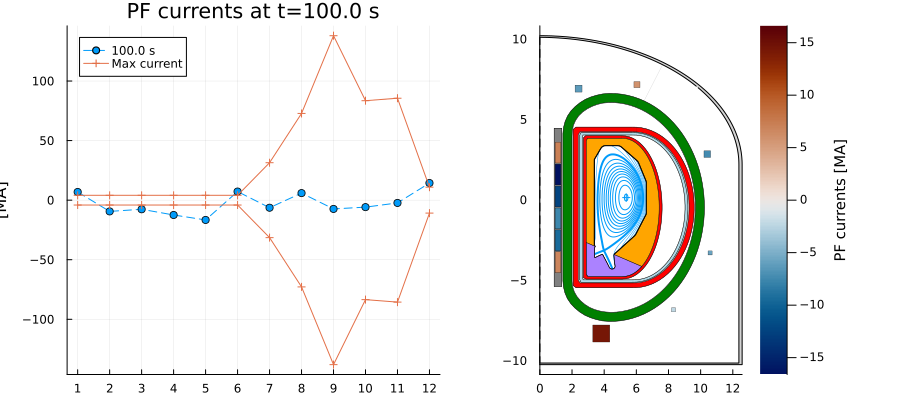

​
​


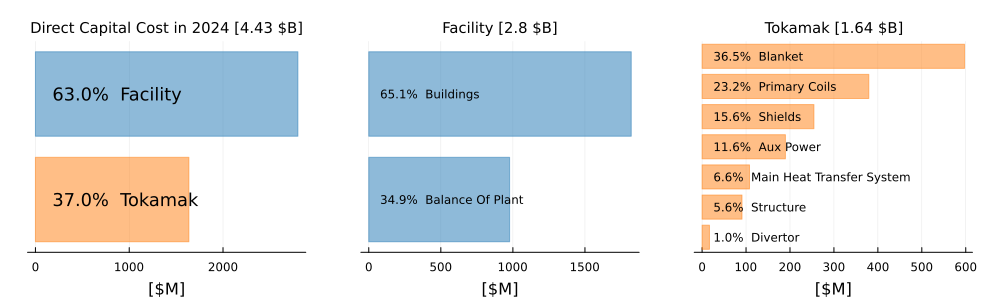

​


In [53]:
FUSE.digest(dd)

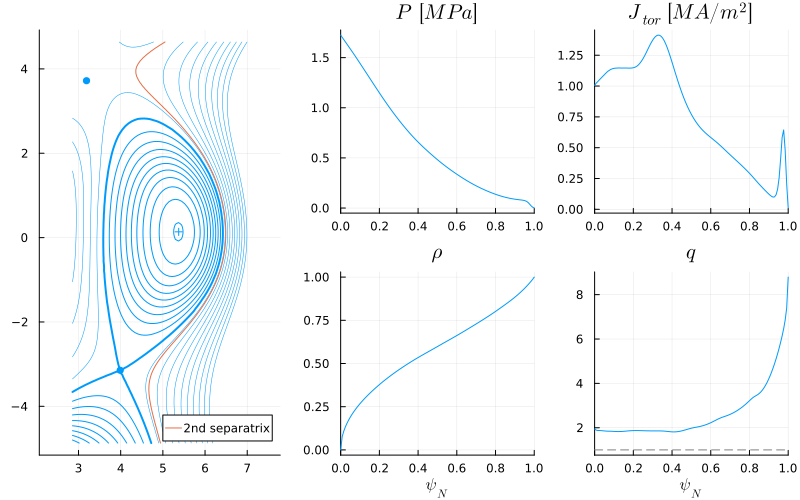

0.06856898819646773

In [54]:
eq = dd.equilibrium.time_slice[]

plot(eq, show_x_points=true)
display(plot!(eq.boundary_secondary_separatrix.outline.r,eq.boundary_secondary_separatrix.outline.z,label="2nd separatrix"))

dRsep = maximum(eq.boundary_secondary_separatrix.outline.r) - maximum(eq.boundary.outline.r)

In [55]:
if false
    savedir = "FPP_build_TEQUILA_MXH/"
    FUSE.save(savedir,dd,ini,act)
end

profiles_1d
├─ current_parallel_inside ➡ 101-element Vector{Float64} [A]
├─ electrons
│  ├─ energy ➡ 101-element Vector{Float64} [W.m^-3]
│  ├─ particles ➡ 101-element Vector{Float64} [m^-3.s^-1] (all 0.0)
│  ├─ particles_inside ➡ 101-element Vector{Float64} [s^-1] (all 0.0)
│  └─ power_inside ➡ 101-element Vector{Float64} [W]
├─ grid
│  ├─ area ➡ 101-element Vector{Float64} [m^2]
│  ├─ psi ➡ Function [Wb]
│  ├─ psi_norm ➡ Function
│  ├─ rho_tor_norm ➡ 101-element Vector{Float64}
│  ├─ surface ➡ 101-element Vector{Float64} [m^2]
│  └─ volume ➡ 101-element Vector{Float64} [m^3]
├─ j_parallel ➡ 101-element Vector{Float64} [A.m^-2]
├─ momentum_tor ➡ 101-element Vector{Float64} [kg.m^-1.s^-2] (all 0.0)
├─ time ➡ 100 [s]
├─ torque_tor_inside ➡ 101-element Vector{Float64} [kg.m^2.s^-2] (all 0.0)
├─ total_ion_energy ➡ 101-element Vector{Float64} [W.m^-3]
└─ total_ion_power_inside ➡ 101-element Vector{Float64} [W]


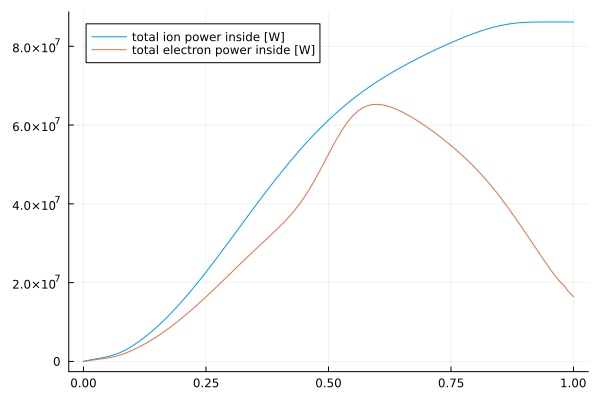

In [56]:
ts = IMAS.total_sources(dd.core_sources, dd.core_profiles.profiles_1d[],)

display(ts)

plot(ts.grid.rho_tor_norm,ts.total_ion_power_inside,label="total ion power inside [W]")
plot!(ts.grid.rho_tor_norm,ts.electrons.power_inside,label="total electron power inside [W]")

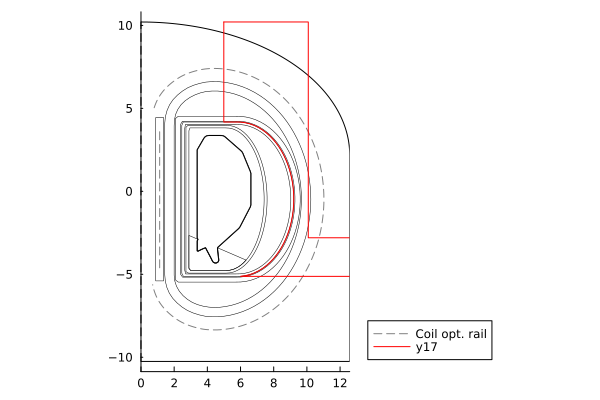

In [62]:
port = dd.build.structure[3]

plot(dd.build, wireframe=true)
plot!(dd.build.pf_active.rail)
plot!(port.outline.r, port.outline.z, color=:red)


In [60]:
dd.build.structure

structure
├─ 1
│  ├─ material ➡ "Tungsten"
│  ├─ name ➡ "lower divertor"
│  ├─ outline
│  │  ├─ r ➡ 64-element Vector{Float64} [m]
│  │  └─ z ➡ 64-element Vector{Float64} [m]
│  ├─ toroidal_extent ➡ 6.28319 [rad]
│  └─ type ➡ 8
├─ 2
│  ├─ name ➡ "blanket"
│  ├─ outline
│  │  ├─ r ➡ 197-element Vector{Float64} [m]
│  │  └─ z ➡ 197-element Vector{Float64} [m]
│  ├─ toroidal_extent ➡ 6.28319 [rad]
│  └─ type ➡ 4
└─ 3
   ├─ name ➡ "vertical maintenance port"
   ├─ outline
   │  ├─ r ➡ 56-element Vector{Float64} [m]
   │  └─ z ➡ 56-element Vector{Float64} [m]
   └─ type ➡ 9
